https://github.com/JaidedAI/EasyOCR

In [1]:
!pip install easyocr

In [1]:
import easyocr
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
plt.rcParams['figure.figsize'] = [20, 20]

support language
https://www.jaided.ai/easyocr/

In [3]:
reader = easyocr.Reader(['en']) # need to run only once to load model into memory
# Simplified Chinese   :ch_sim
# Traditional Chinese  :ch_tra

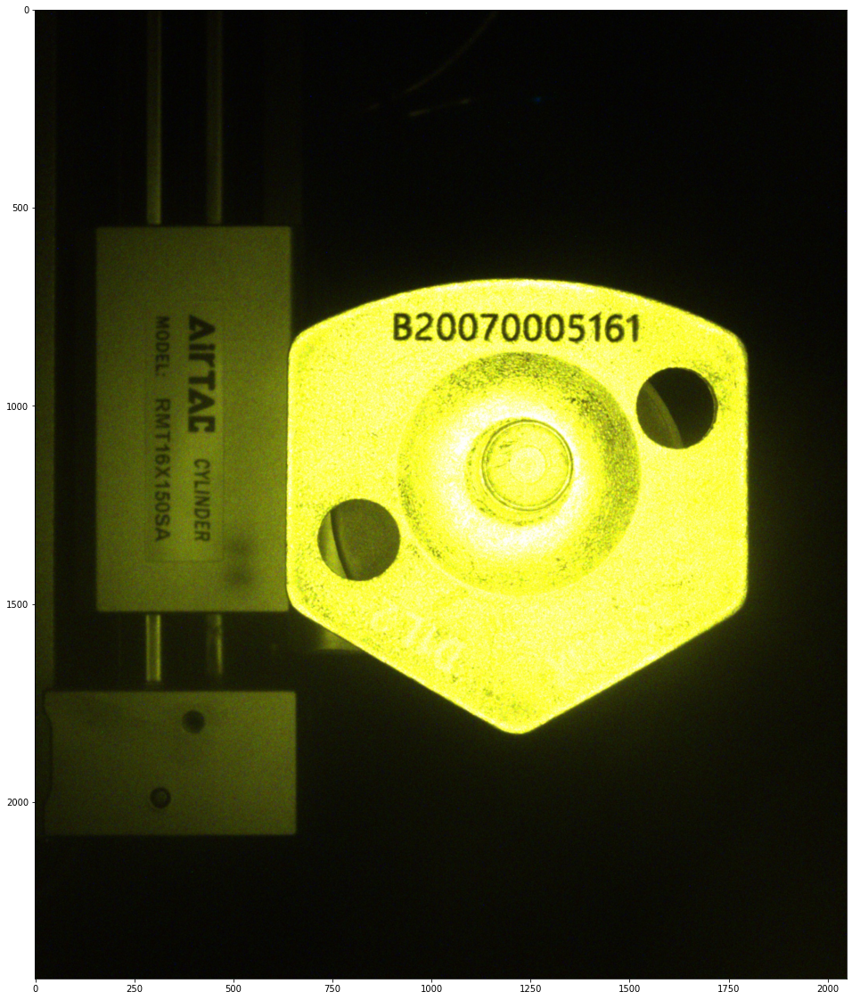

In [4]:
img = cv2.imread('./data//Recipe_2_194800378_20200727 041103.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [5]:
result = reader.readtext(img, decoder='beamsearch')
result

[([[893, 755], [1542, 755], [1542, 855], [893, 855]],
  'B20070005161',
  0.9742810456762074),
 ([[294, 766], [348, 766], [348, 931], [294, 931]], '!', 0.09028683830806372),
 ([[373, 767], [469, 767], [469, 1080], [373, 1080]], '1', 0.3178175221835353),
 ([[296, 976], [348, 976], [348, 1190], [296, 1190]], '1', 0.5982564624048337),
 ([[286, 1117], [458, 1117], [458, 1360], [286, 1360]],
  '',
  0.13389570685348318)]

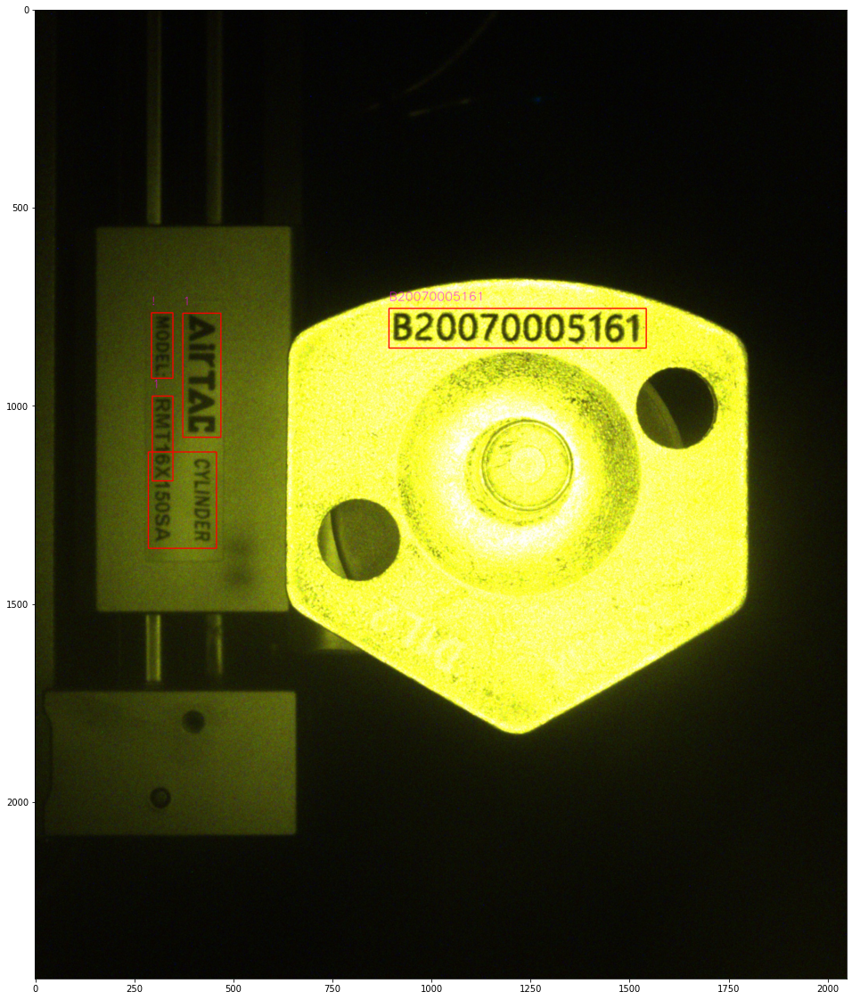

In [6]:
for [bbx, ans, prob] in result:
    img = cv2.rectangle(img,(bbx[0][0],bbx[0][1]),(bbx[2][0],bbx[2][1]),(0,0,255),2)
    cv2.putText(img, ans, (bbx[0][0], bbx[0][1]-20), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 255), 1, cv2.LINE_AA)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

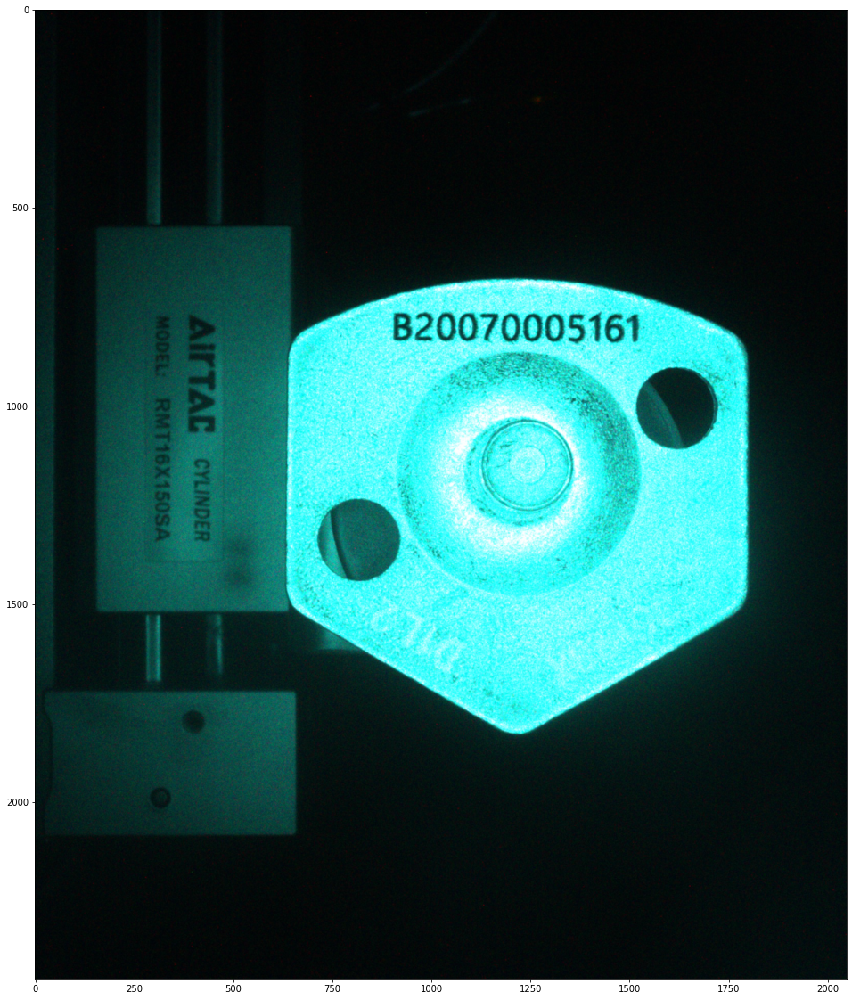

In [7]:
img = cv2.imread('./data/Recipe_2_194800378_20200727 041103.jpg')
plt.imshow(img)

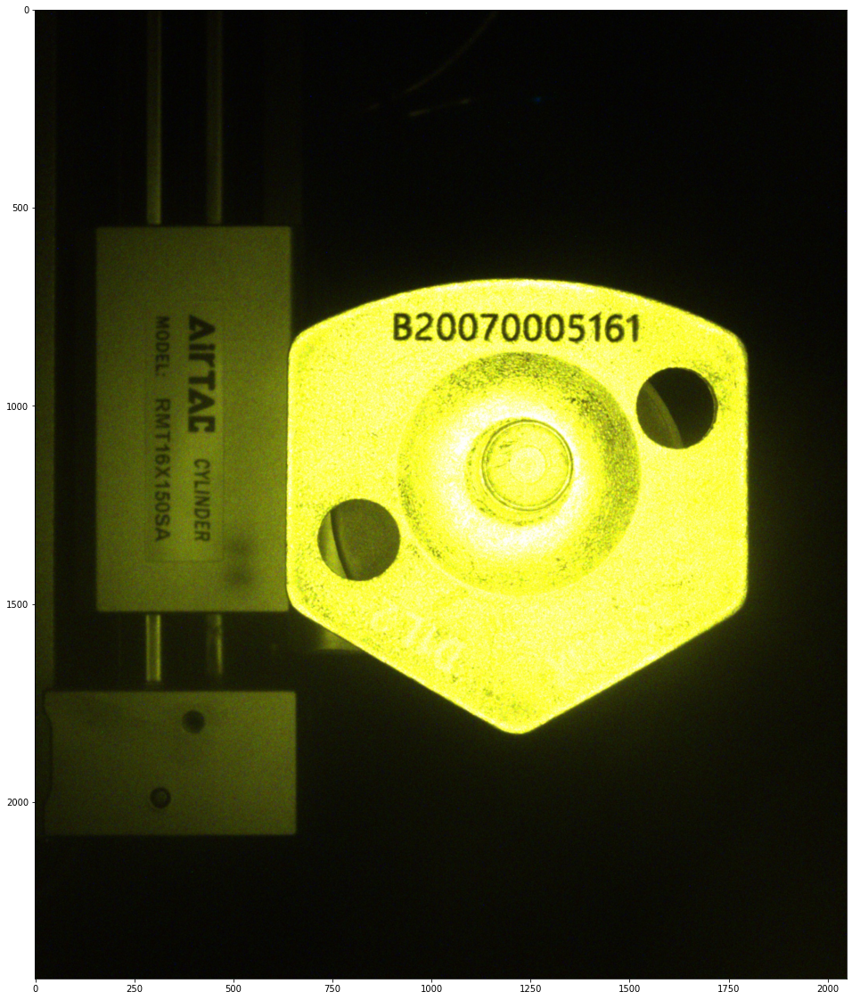

In [8]:
img = cv2.imread('./data/Recipe_2_194800378_20200727 041103.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

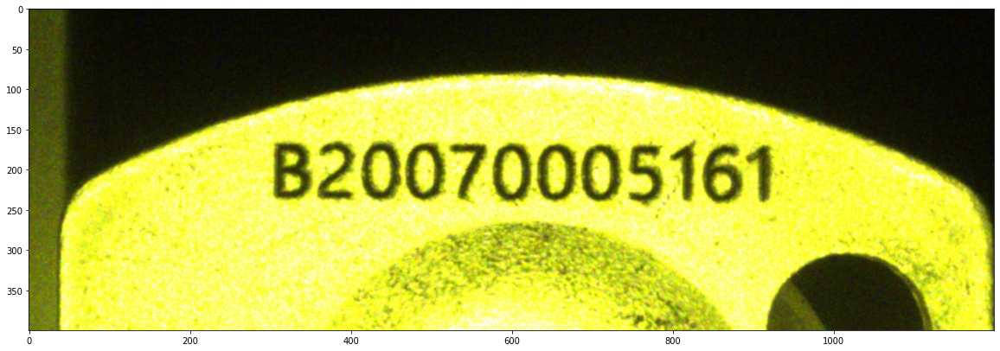

In [9]:
roi = img[600:1000,600:1800]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

In [10]:
result = reader.readtext(roi,batch_size=1)
result

[([[293, 155], [942, 155], [942, 257], [293, 257]],
  'B20070005161',
  0.9870100160890195)]

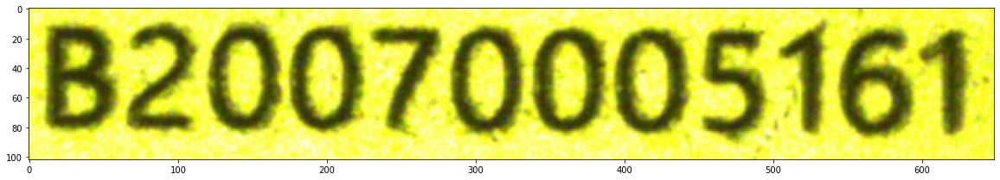

In [11]:
result = reader.readtext(roi,batch_size=1)
x_min, x_max, y_min, y_max = 10000,0,10000,0
for x,y in result[0][0]:
    x_min = min(x_min, x)
    x_max = max(x_max, x)
    y_min = min(y_min, y)
    y_max = max(y_max, y)
roi = roi[y_min:y_max, x_min:x_max]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

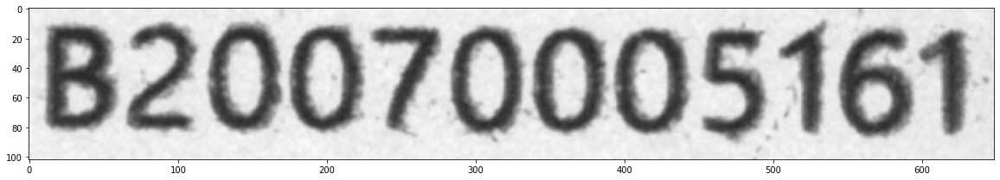

In [12]:

gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))

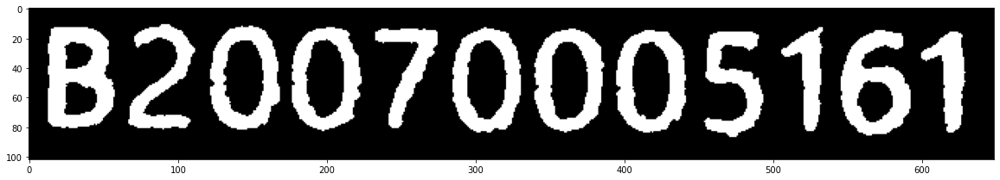

In [13]:
re, th = cv2.threshold(gray, 127,255,cv2.THRESH_BINARY_INV)
plt.imshow(cv2.cvtColor(th, cv2.COLOR_BGR2RGB))

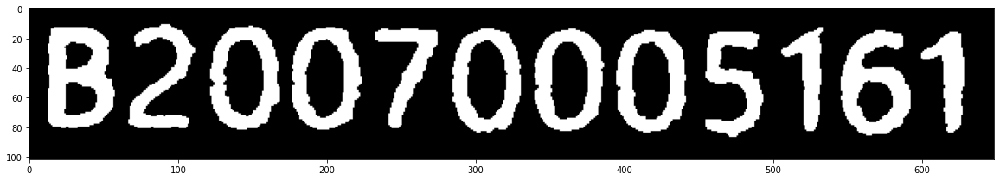

In [14]:
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel)
plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))

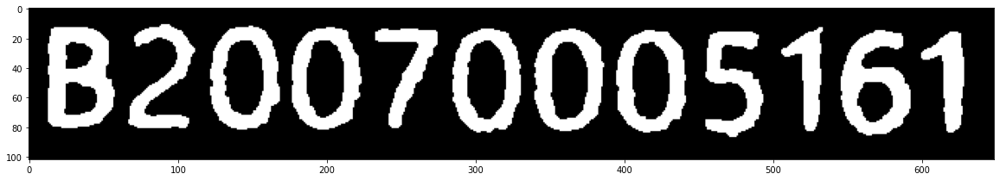

In [15]:
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
plt.imshow(cv2.cvtColor(closing, cv2.COLOR_BGR2RGB))

600 16 29 68
455 16 39 71
546 15 47 71
395 15 47 69
340 14 47 69
285 14 46 70
233 14 42 67
506 13 28 70
177 13 47 69
13 13 45 68
122 12 47 70
67 11 45 70


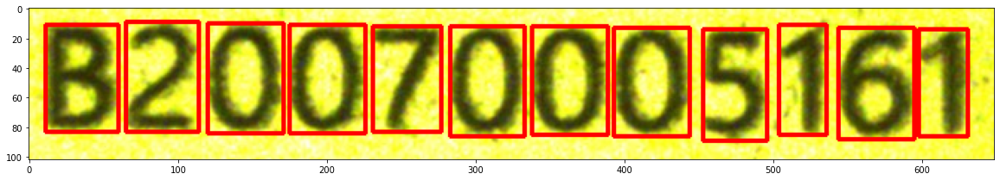

In [16]:
cnts, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
count = 0
ans = []
for c in cnts:
    if cv2.contourArea(c) < 300:
        continue
    x,y,w,h = cv2.boundingRect(c)
    print(x,y,w,h)
    result = reader.readtext(roi[y-8:y+h+8,x-5:x+w+5],batch_size=1)
    if len(result) != 0:
        pred = result[0][1]
    if len(result) != 0:
        ans.append(result[0])
    roi = cv2.rectangle(roi,(x-2,y-2),(x+w+2,y+h+2),(0,0,255),2)
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

In [17]:
ans

[([[0, 2], [49, 2], [49, 84], [0, 84]], '5', 0.9999914169495696),
 ([[0, 5], [57, 5], [57, 85], [0, 85]], '6', 0.9999510055821226),
 ([[0, 1], [57, 1], [57, 81], [0, 81]], '0', 0.999902250771413),
 ([[0, 4], [56, 4], [56, 82], [0, 82]], '0', 0.999955058602783),
 ([[0, 4], [56, 4], [56, 82], [0, 82]], '0', 0.9999489790748726),
 ([[0, 2], [52, 2], [52, 78], [0, 78]], '7', 0.6452772973796265),
 ([[0, 4], [56, 4], [56, 82], [0, 82]], '0', 0.9999316942435463),
 ([[0, 1], [55, 1], [55, 83], [0, 83]], 'B', 0.9980589043423471),
 ([[0, 3], [57, 3], [57, 83], [0, 83]], '0', 0.9994791046969674),
 ([[0, 4], [54, 4], [54, 84], [0, 84]], '2', 0.9999995231628986)]

# 另個範例

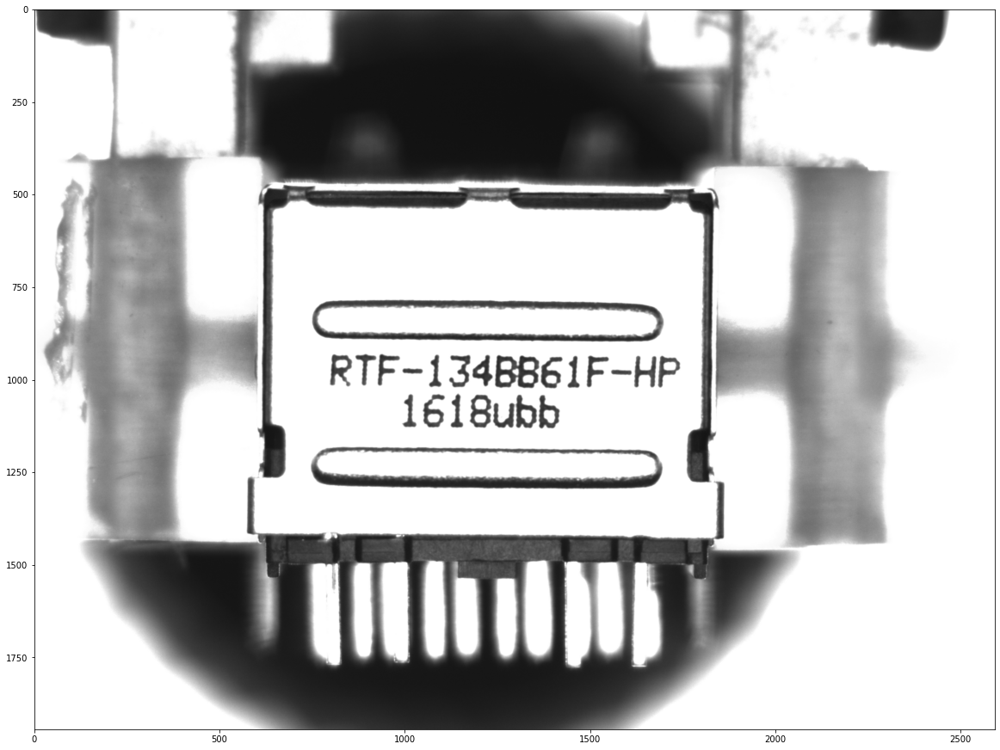

In [18]:
img = cv2.imread('./data/ocr02.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

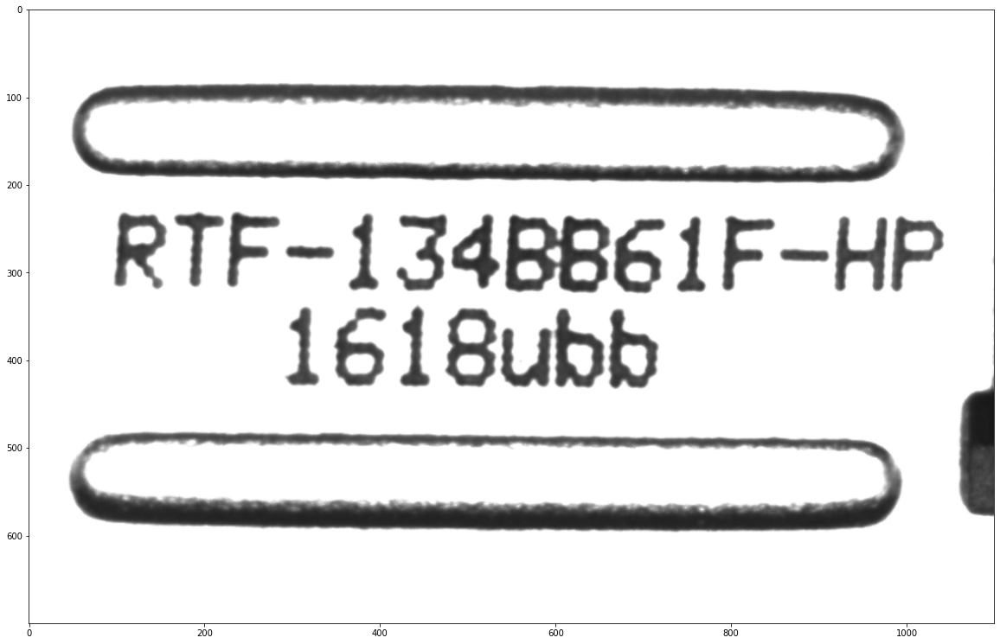

In [19]:
roi = img[700:1400,700:1800]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

In [20]:
result = reader.readtext(roi,batch_size=1)
result

[([[83, 216], [1052, 216], [1052, 341], [83, 341]],
  'RTF-134B861F-HP',
  0.9248716769701695),
 ([[275, 324], [732, 324], [732, 449], [275, 449]],
  '1618ubb',
  0.6325520973444957)]

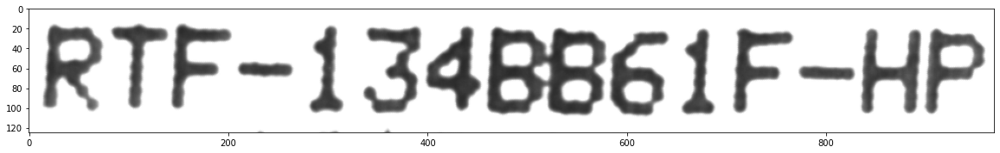

In [21]:
result = reader.readtext(roi,batch_size=1)
x_min, x_max, y_min, y_max = 10000,0,10000,0
for x,y in result[0][0]:
    x_min = min(x_min, x)
    x_max = max(x_max, x)
    y_min = min(y_min, y)
    y_max = max(y_max, y)
roi = roi[y_min:y_max, x_min:x_max]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

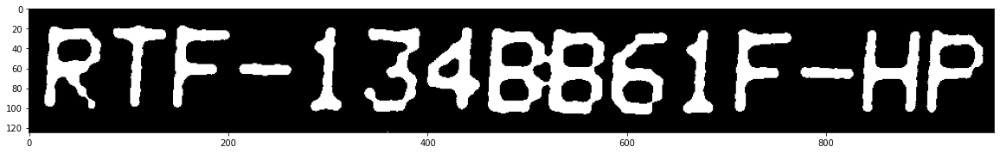

In [22]:
gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
re, th = cv2.threshold(gray, 127,255,cv2.THRESH_BINARY_INV)
plt.imshow(cv2.cvtColor(th, cv2.COLOR_BGR2RGB))

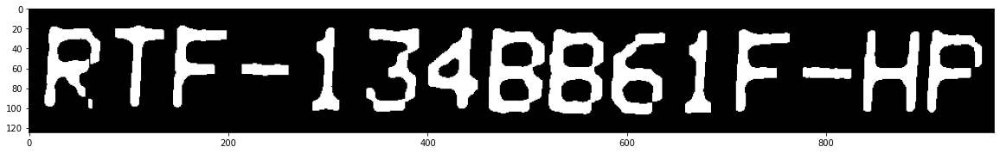

In [23]:
kernel = np.ones((9,3),np.uint8)
opening = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel)
plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))

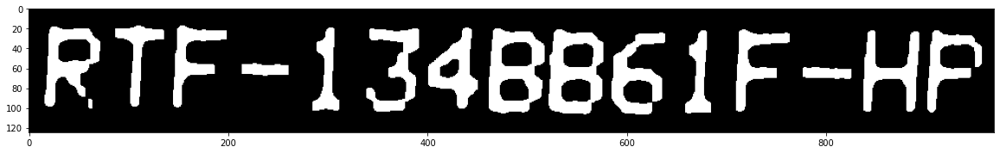

In [24]:
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
plt.imshow(cv2.cvtColor(closing, cv2.COLOR_BGR2RGB))

777 59 49 12
214 55 47 13
585 24 54 83
902 22 55 83
838 22 56 82
659 22 26 84
710 21 54 83
522 21 55 86
462 20 56 86
339 20 53 84
401 19 50 82
285 19 27 84
16 18 56 81
145 17 54 83
87 17 49 82


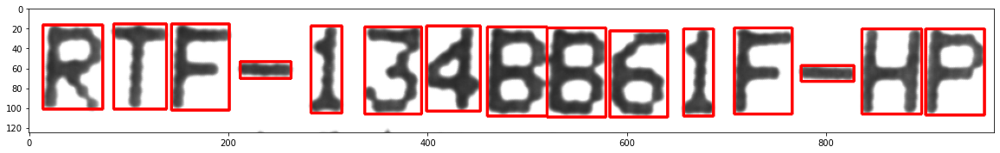

In [25]:
cnts, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
count = 0
ans = []
for c in cnts:
    if cv2.contourArea(c) < 300: # bbx 面積太小就忽略
        continue
    x,y,w,h = cv2.boundingRect(c)
    print(x,y,w,h)
    result = reader.readtext(roi[y-8:y+h+8,x-5:x+w+5],batch_size=1)
    if len(result) != 0:
        pred = result[0][1]
    if len(result) != 0:
        ans.append(result[0])
    roi = cv2.rectangle(roi,(x-2,y-2),(x+w+2,y+h+2),(0,0,255),2)
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

In [26]:
ans

[([[0, 2], [64, 2], [64, 99], [0, 99]], '6', 0.999994277962287),
 ([[0, 2], [65, 2], [65, 96], [0, 96]], 'P', 0.743136054654542),
 ([[0, 0], [66, 0], [66, 98], [0, 98]], 'H', 0.599913145944786),
 ([[0, 7], [36, 7], [36, 91], [0, 91]], '1', 0.9461124746835914),
 ([[0, 2], [64, 2], [64, 98], [0, 98]], 'F', 0.9991920434905275),
 ([[0, 0], [65, 0], [65, 100], [0, 100]], '8', 0.9996900798635124),
 ([[0, 2], [66, 2], [66, 98], [0, 98]], 'B', 0.9786617992304834),
 ([[0, 0], [63, 0], [63, 96], [0, 96]], '3', 0.9999539857435735),
 ([[0, 0], [60, 0], [60, 98], [0, 98]], '4', 0.9999978542339392),
 ([[0, 4], [37, 4], [37, 94], [0, 94]], '1', 0.9996588521137397),
 ([[0, 4], [64, 4], [64, 98], [0, 98]], 'F', 0.9983103266268358),
 ([[0, 5], [59, 5], [59, 89], [0, 89]], 'T', 0.969007400841182)]